# Flight delays

All the packages that will be necessary for the development of the project are loaded:

In [53]:
import datetime, warnings, scipy
import math
import pandas as pd
import numpy as np
import seaborn as sns
from random import sample
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as pltc
from matplotlib.patches import ConnectionPatch
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Tahoma']
from collections import OrderedDict
from matplotlib.gridspec import GridSpec
from mpl_toolkits.basemap import Basemap
from sklearn import metrics, linear_model
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from scipy.optimize import curve_fit
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor = 'dimgray', linewidth=1)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"
pd.options.display.max_columns = 50
%matplotlib inline
warnings.filterwarnings("ignore")


# Preamble: overview of the dataset

The file contains the details of all flights that occurred in 2008. The file is loaded and information about the types of variables in the data frame and the number of null values for each variable is obtained:


In [2]:
df = pd.read_csv('DelayedFlights.csv', index_col=0, low_memory=False)
print('Dataframe dimensions:', df.shape)
#____________________________________________________________
# gives some infos on columns types and number of null values
tab_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100)
                         .T.rename(index={0:'null values (%)'}))
tab_info

Dataframe dimensions: (1936758, 29)


,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
column type,int64,int64,int64,int64,float64,int64,float64,int64,object,int64,object,float64,float64,float64,float64,float64,object,object,int64,float64,float64,int64,object,int64,float64,float64,float64,float64,float64
null values (nb),0,0,0,0,0,0,7110,0,0,0,5,8387,198,8387,8387,0,0,0,0,7110,455,0,0,0,689270,689270,689270,689270,689270
null values (%),0.0,0.0,0.0,0.0,0.0,0.0,0.367108,0.0,0.0,0.0,0.000258,0.433043,0.010223,0.433043,0.433043,0.0,0.0,0.0,0.0,0.367108,0.023493,0.0,0.0,0.0,35.588855,35.588855,35.588855,35.588855,35.588855


Each entry in the flights.csv file corresponds to a flight and we see that 1,936,758 flights were recorded in 2008. These flights are described according to 31 variables. Below is a description of these variables and a brief summary of the meaning of each variable:

YEAR, MONTH, DAY, DAY_OF_WEEK: dates of the flight

AIRLINE: An identification number assigned by US DOT to identify a unique airline

ORIGIN_AIRPORT and DESTINATION_AIRPORT: code attributed by IATA to identify the airports

SCHEDULED_DEPARTURE and SCHEDULED_ARRIVAL : scheduled times of take-off and landing

DEPARTURE_TIME and ARRIVAL_TIME: real times at which take-off and landing took place

DEPARTURE_DELAY and ARRIVAL_DELAY: difference (in minutes) between planned and real times

DISTANCE: distance (in miles)

Given the large size of the data set, only a subset of the data will be used to reduce computation time. Selecting only flights from January 2008:


In [3]:
df = df[df['Month'] == 1]

# Cleaning

* Dates and times

In the initial data frame, dates are encoded according to 4 variables: YEAR, MONTH, DAY and DAY_WEEK.
The most convenient way to work is with dates and times, for this the python function datetime is used to convert dates into that format: 

In [4]:
df.rename(columns={'DayofMonth' : 'Day'}, inplace=True)
df['Date'] = pd.to_datetime(df[['Year','Month', 'Day']])
df.head()

,Year,Month,Day,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Date
0,2008,1,3,4,2003.0,1955,2211.0,2225,WN,335,N712SW,128.0,150.0,116.0,-14.0,8.0,IAD,TPA,810,4.0,8.0,0,N,0,NaN,NaN,NaN,NaN,NaN,2008-01-03
1,2008,1,3,4,754.0,735,1002.0,1000,WN,3231,N772SW,128.0,145.0,113.0,2.0,19.0,IAD,TPA,810,5.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN,2008-01-03
2,2008,1,3,4,628.0,620,804.0,750,WN,448,N428WN,96.0,90.0,76.0,14.0,8.0,IND,BWI,515,3.0,17.0,0,N,0,NaN,NaN,NaN,NaN,NaN,2008-01-03
4,2008,1,3,4,1829.0,1755,1959.0,1925,WN,3920,N464WN,90.0,90.0,77.0,34.0,34.0,IND,BWI,515,3.0,10.0,0,N,0,2.0,0.0,0.0,0.0,32.0,2008-01-03
5,2008,1,3,4,1940.0,1915,2121.0,2110,WN,378,N726SW,101.0,115.0,87.0,11.0,25.0,IND,JAX,688,4.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN,2008-01-03


Defining functions to merge the take-off hour with the flight date:

In [5]:
#_________________________________________________________
# Function that convert the 'HHMM' string to datetime.time
def format_heure(chaine):
    if pd.isnull(chaine):
        return np.nan
    else:
        if chaine == 2400: chaine = 0
        chaine = "{0:04d}".format(int(chaine))
        heure = datetime.time(int(chaine[0:2]), int(chaine[2:4]))
        return heure
#_____________________________________________________________________
# Function that combines a date and time to produce a datetime.datetime
def combine_date_heure(x):
    if pd.isnull(x[0]) or pd.isnull(x[1]):
        return np.nan
    else:
        return datetime.datetime.combine(x[0],x[1])
#_______________________________________________________________________________
# Function that combine two columns of the dataframe to create a datetime format
def create_flight_time(df, col):    
    liste = []
    for index, cols in df[['Date', col]].iterrows():    
        if pd.isnull(cols[1]):
            liste.append(np.nan)
        elif float(cols[1]) == 2400:
            cols[0] += datetime.timedelta(days=1)
            cols[1] = datetime.time(0,0)
            liste.append(combine_date_heure(cols))
        else:
            cols[1] = format_heure(cols[1])
            liste.append(combine_date_heure(cols))
    return pd.Series(liste)

In [6]:
df.rename(columns={
    'UniqueCarrier':'AIRLINE',
    'Origin':'ORIGIN_AIRPORT',
    'Dest':'DESTINATION_AIRPORT',
    'CRSDepTime':'SCHEDULED_DEPARTURE',
    'DepTime':'DEPARTURE_TIME',
    'DepDelay':'DEPARTURE_DELAY',
    'CRSArrTime':'SCHEDULED_ARRIVAL',
    'ArrTime':'ARRIVAL_TIME',
    'ArrDelay':'ARRIVAL_DELAY',
    'CRSElapsedTime':'SCHEDULED_TIME',
    'ActualElapsedTime':'ELAPSED_TIME'
    }, inplace = True)

In [7]:
df.columns

Index(['Year', 'Month', 'Day', 'DayOfWeek', 'DEPARTURE_TIME',
       'SCHEDULED_DEPARTURE', 'ARRIVAL_TIME', 'SCHEDULED_ARRIVAL', 'AIRLINE',
       'FlightNum', 'TailNum', 'ELAPSED_TIME', 'SCHEDULED_TIME', 'AirTime',
       'ARRIVAL_DELAY', 'DEPARTURE_DELAY', 'ORIGIN_AIRPORT',
       'DESTINATION_AIRPORT', 'Distance', 'TaxiIn', 'TaxiOut', 'Cancelled',
       'CancellationCode', 'Diverted', 'CarrierDelay', 'WeatherDelay',
       'NASDelay', 'SecurityDelay', 'LateAircraftDelay', 'Date'],
      dtype='object')

The take-off time, stored in the variable SCHEDULED_DEPARTURE, is encoded as a float where the first two digits indicate the hour and the last two, the minutes. A more convenient format is to merge the take-off time with the date of the flight. The transformation is performed using the following functions that modify the dataframe variables:

In [8]:
df['SCHEDULED_DEPARTURE'] = create_flight_time(df, 'SCHEDULED_DEPARTURE')
df['DEPARTURE_TIME'] = df['DEPARTURE_TIME'].apply(format_heure)
df['SCHEDULED_ARRIVAL'] = df['SCHEDULED_ARRIVAL'].apply(format_heure)
df['ARRIVAL_TIME'] = df['ARRIVAL_TIME'].apply(format_heure)
#__________________________________________________________________________
df.loc[:5, ['SCHEDULED_DEPARTURE', 'SCHEDULED_ARRIVAL', 'DEPARTURE_TIME',
             'ARRIVAL_TIME', 'DEPARTURE_DELAY', 'ARRIVAL_DELAY']]

,SCHEDULED_DEPARTURE,SCHEDULED_ARRIVAL,DEPARTURE_TIME,ARRIVAL_TIME,DEPARTURE_DELAY,ARRIVAL_DELAY
0,2008-01-03 19:55:00,22:25:00,20:03:00,22:11:00,8.0,-14.0
1,2008-01-03 07:35:00,10:00:00,07:54:00,10:02:00,19.0,2.0
2,2008-01-03 06:20:00,07:50:00,06:28:00,08:04:00,8.0,14.0
4,2008-01-03 19:15:00,19:25:00,18:29:00,19:59:00,34.0,34.0
5,2008-01-03 18:30:00,21:10:00,19:40:00,21:21:00,25.0,11.0


The variables DEPARTURE_TIME and ARRIVAL_TIME do not contain dates and are therefore very difficult to interpret. Therefore, the variables DEPARTURE_DELAY and ARRIVAL_DELAY are more useful as they directly provide delays in minutes, so from now on the variables DEPARTURE_TIME and ARRIVAL_TIME will not be used.

* Filling factor
The dataframe is cleaned up by eliminating variables that will not be used and the columns are reorganized to make them easier to read:

In [9]:
variables_to_remove = ['TaxiOut', 'TaxiIn','Year','Month','Day','DayOfWeek','Date', 'NASDelay',
                       'SecurityDelay', 'CarrierDelay', 'LateAircraftDelay',
                       'WeatherDelay', 'Diverted', 'Cancelled', 'CancellationCode',
                       'FlightNum', 'TailNum', 'AirTime']
df.drop(variables_to_remove, axis = 1, inplace = True)

In [10]:
df.rename(columns={
    'UniqueCarrier':'AIRLINE',
    'Origin':'ORIGIN_AIRPORT',
    'Dest':'DESTINATION_AIRPORT',
    'CRSDepTime':'SCHEDULED_DEPARTURE',
    'DepTime':'DEPARTURE_TIME',
    'DepDelay':'DEPARTURE_DELAY',
    'CRSArrTime':'SCHEDULED_ARRIVAL',
    'ArrTime':'ARRIVAL_TIME',
    'ArrDelay':'ARRIVAL_DELAY',
    'CRSElapsedTime':'SCHEDULED_TIME',
    'ActualElapsedTime':'ELAPSED_TIME'
    }, inplace = True)

In [11]:
df = df[["AIRLINE","ORIGIN_AIRPORT","DESTINATION_AIRPORT","SCHEDULED_DEPARTURE","DEPARTURE_TIME","DEPARTURE_DELAY","SCHEDULED_ARRIVAL","ARRIVAL_TIME","ARRIVAL_DELAY","SCHEDULED_TIME","ELAPSED_TIME"]]
df[:5]

,AIRLINE,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,SCHEDULED_TIME,ELAPSED_TIME
0,WN,IAD,TPA,2008-01-03 19:55:00,20:03:00,8.0,22:25:00,22:11:00,-14.0,150.0,128.0
1,WN,IAD,TPA,2008-01-03 07:35:00,07:54:00,19.0,10:00:00,10:02:00,2.0,145.0,128.0
2,WN,IND,BWI,2008-01-03 06:20:00,06:28:00,8.0,07:50:00,08:04:00,14.0,90.0,96.0
4,WN,IND,BWI,2008-01-03 19:15:00,18:29:00,34.0,19:25:00,19:59:00,34.0,90.0,90.0
5,WN,IND,JAX,2008-01-03 18:30:00,19:40:00,25.0,21:10:00,21:21:00,11.0,115.0,101.0


The data set is examined for completeness:

In [12]:
missing_df = df.isnull().sum(axis=0).reset_index()
missing_df.columns = ['VARIABLE', 'MISSING VALUES']
missing_df['FILLING FACTOR (%)']=(df.shape[0]-missing_df['MISSING VALUES'])/df.shape[0]*100
missing_df.sort_values('FILLING FACTOR (%)').reset_index(drop = True)

,VARIABLE,MISSING VALUES,FILLING FACTOR (%)
0,SCHEDULED_DEPARTURE,126897,30.856495
1,ARRIVAL_TIME,612,99.666534
2,ARRIVAL_DELAY,612,99.666534
3,ELAPSED_TIME,612,99.666534
4,SCHEDULED_TIME,35,99.980929
5,AIRLINE,0,100.000000
6,ORIGIN_AIRPORT,0,100.000000
7,DESTINATION_AIRPORT,0,100.000000
8,DEPARTURE_TIME,0,100.000000
9,DEPARTURE_DELAY,0,100.000000


The fill factor of the variables is very good (> 99%) so that it is possible to proceed without the need to impute missing data and entries containing missing values are eliminated.

In [13]:
df.dropna(inplace = True)

* Comparison of airlines

The AIRLINE variable contains the abbreviations of the airlines and their full names can be obtained from the airlines.csv file. Building a data frame with the IATA codes and the names of the Airlines  

In [14]:
l =[["HA", "Hawaiian Airlines Inc."],
    ["AQ", "Aloha Airlines"],
    ["F9", "Frontier Airlines Inc."],
    ["AS", "Alaska Airlines Inc."],
    ["B6", "JetBlue Airways"],
    ["FL", "AirTran Airways"],
    ["OH", "PSA Airlines"],
    ["YV", "Mesa Airlines Inc. "],
    ["9E", "Endeavor Air"],
    ["CO", "Continental Air Lines"],
    ["NW", "Northwest Air Lines"],
    ["EV", "Atlantic Southeast Airlines"],
    ["DL", "Delta Air Lines Inc."],
    ["US", "US Airways Inc."],
    ["XE", "ExpressJet Airlines Inc."],
    ["MQ", "American Eagle Airlines Inc."],
    ["UA", "United Air Lines Inc."],
    ["OO", "Skywest Airlines Inc."],
    ["AA", "American Airlines Inc."],
    ["WN", "Southwest Airlines Co."]]
airlines_names = pd.DataFrame(l, columns = ["IATA_CODE","AIRLINE"])
airlines_names

,IATA_CODE,AIRLINE
0,HA,Hawaiian Airlines Inc.
1,AQ,Aloha Airlines
2,F9,Frontier Airlines Inc.
3,AS,Alaska Airlines Inc.
4,B6,JetBlue Airways
5,FL,AirTran Airways
6,OH,PSA Airlines
7,YV,Mesa Airlines Inc.
8,9E,Endeavor Air
9,CO,Continental Air Lines


For later use, the content of this data frame is incorporated into a Python dictionary:

In [15]:
abbr_companies = airlines_names.set_index('IATA_CODE')['AIRLINE'].to_dict()
abbr_companies

{'HA': 'Hawaiian Airlines Inc.',
 'AQ': 'Aloha Airlines',
 'F9': 'Frontier Airlines Inc.',
 'AS': 'Alaska Airlines Inc.',
 'B6': 'JetBlue Airways',
 'FL': 'AirTran Airways',
 'OH': 'PSA Airlines',
 'YV': 'Mesa Airlines Inc. ',
 '9E': 'Endeavor Air',
 'CO': 'Continental Air Lines',
 'NW': 'Northwest Air Lines',
 'EV': 'Atlantic Southeast Airlines',
 'DL': 'Delta Air Lines Inc.',
 'US': 'US Airways Inc.',
 'XE': 'ExpressJet Airlines Inc.',
 'MQ': 'American Eagle Airlines Inc.',
 'UA': 'United Air Lines Inc.',
 'OO': 'Skywest Airlines Inc.',
 'AA': 'American Airlines Inc.',
 'WN': 'Southwest Airlines Co.'}

* Basic statistical description of airlines.

All flights of all airlines are considered in order to classify them according to their punctuality and for this purpose the basic statistical parameters are calculated:

In [16]:
#__________________________________________________________________
# function that extract statistical parameters from a grouby objet:
def get_stats(group):
    return {'COUNT': group.count(),'MIN': group.min(),
             'MEAN': group.mean(), 'MAX': group.max()}
#_______________________________________________________________
# Creation of a dataframe with statitical infos on each airline:
global_stats = df['DEPARTURE_DELAY'].groupby(df['AIRLINE']).apply(get_stats).unstack()
global_stats = global_stats.sort_values('COUNT')
global_stats

,COUNT,MIN,MEAN,MAX
AIRLINE,,,,
OH,4353.0,6.0,39.509993,615.0
OO,5339.0,6.0,57.686084,587.0
YV,5882.0,6.0,62.202992,435.0
XE,10219.0,6.0,44.686858,653.0
WN,30650.0,6.0,33.697651,516.0


In [17]:
global_stats.index

Index(['OH', 'OO', 'YV', 'XE', 'WN'], dtype='object', name='AIRLINE')

In [18]:
global_stats.shape

(5, 4)

In [45]:
# find elements in df that are not in airlines_names
dfnotin2 = df[~(df['AIRLINE'].isin(airlines_names['IATA_CODE']) & df['AIRLINE'].isin(airlines_names['IATA_CODE']))].reset_index(drop=True)
# output:
set_data_df = dfnotin2.groupby('AIRLINE').count()
index = set_data_df.index
index
#['9E', 'AQ', 'CO', 'FL', 'NW', 'OH', 'XE', 'YV']

Index([], dtype='object', name='AIRLINE')

# Construct some graphs to facilitate the reading of the information.

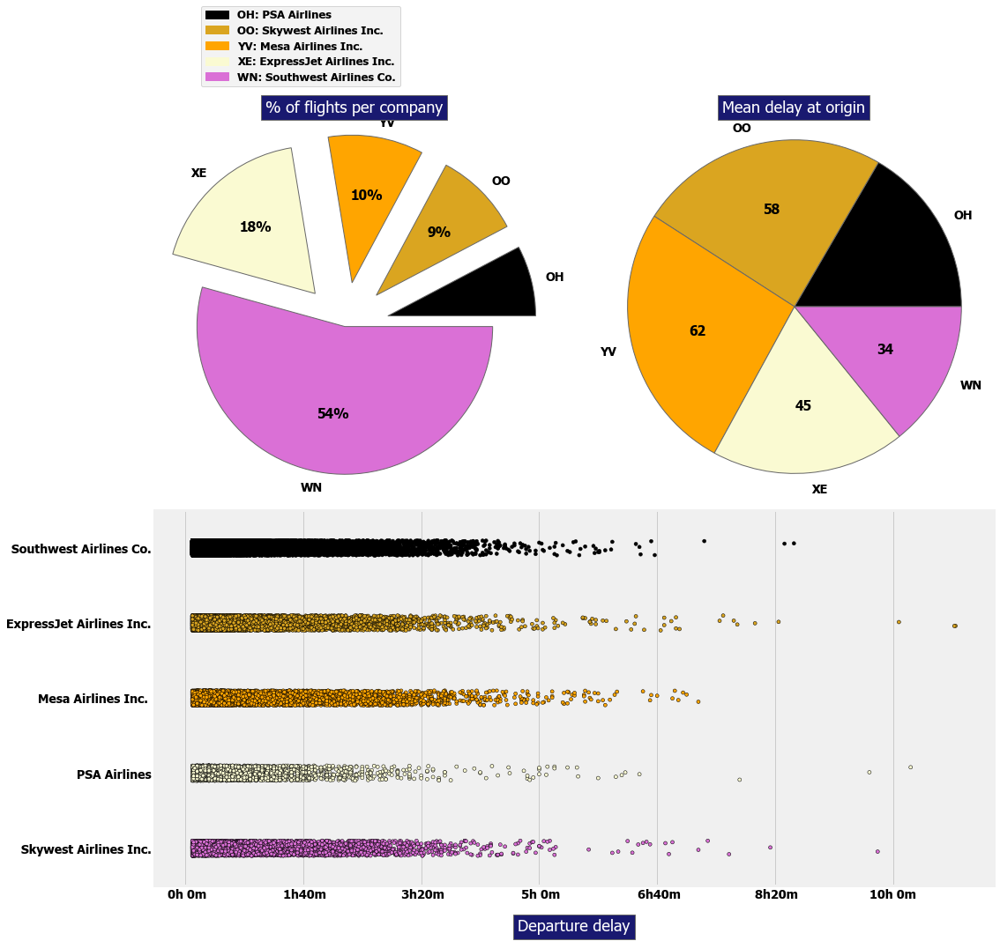

In [22]:
font = {'family' : 'Tahoma', 'weight' : 'bold', 'size'   : 15}
mpl.rc('font', **font)
import matplotlib.patches as mpatches
#__________________________________________________________________
# I extract a subset of columns and redefine the airlines labeling 
df2 = df.loc[:, ['AIRLINE', 'DEPARTURE_DELAY']]
df2['AIRLINE'] = df2['AIRLINE'].replace(abbr_companies)
#________________________________________________________________________
# Defining colors
all_colors = [k for k,v in pltc.cnames.items()]
colors = sample(all_colors, len(global_stats))
#print('colors: ', colors)
#___________________________________
fig = plt.figure(1, figsize=(16,15))
gs=GridSpec(2,2)             
ax1=fig.add_subplot(gs[0,0]) 
ax2=fig.add_subplot(gs[0,1]) 
ax3=fig.add_subplot(gs[1,:]) 
#------------------------------
# Pie chart nº1: nb of flights
#------------------------------
labels = [s for s in  global_stats.index]
sizes  = global_stats['COUNT'].values
explode = [0.3 if sizes[i] < 20000 else 0.0 for i in range(len(global_stats))]
patches, texts, autotexts = ax1.pie(sizes, explode = explode,
                                labels=labels, colors = colors,  autopct='%1.0f%%',
                                shadow=False, startangle=0)
for i in range(len(global_stats)): 
    texts[i].set_fontsize(14)
ax1.axis('equal')
ax1.set_title('% of flights per company', bbox={'facecolor':'midnightblue', 'pad':5},
              color = 'w',fontsize=18)
#_______________________________________________
# I set the legend: abreviation -> airline name
comp_handler = []
for i in range(len(global_stats)):
    comp_handler.append(mpatches.Patch(color=colors[i],
            label = global_stats.index[i] + ': ' + abbr_companies[global_stats.index[i]]))
ax1.legend(handles=comp_handler, bbox_to_anchor=(0.2, 0.9), 
           fontsize = 13, bbox_transform=plt.gcf().transFigure)
#----------------------------------------
# Pie chart nº2: mean delay at departure
#----------------------------------------
sizes  = global_stats['MEAN'].values
sizes  = [max(s,0) for s in sizes]
explode = [0.0 if sizes[i] < 20000 else 0.01 for i in range(len(global_stats))]
patches, texts, autotexts = ax2.pie(sizes, explode = explode, labels = labels,
                                colors = colors, shadow=False, startangle=0,
                                autopct = lambda p :  '{:.0f}'.format(p * sum(sizes) / 100))
for i in range(len(global_stats)): 
    texts[i].set_fontsize(14)
ax2.axis('equal')
ax2.set_title('Mean delay at origin', bbox={'facecolor':'midnightblue', 'pad':5},
              color='w', fontsize=18)
#------------------------------------------------------
# striplot with all the values reported for the delays
#___________________________________________________________________
ax3 = sns.stripplot(y="AIRLINE", x="DEPARTURE_DELAY", size = 4, palette = colors,
                    data=df2, linewidth = 0.5,  jitter=True)
plt.setp(ax3.get_xticklabels(), fontsize=14)
plt.setp(ax3.get_yticklabels(), fontsize=14)
ax3.set_xticklabels(['{:2.0f}h{:2.0f}m'.format(*[int(y) for y in divmod(x,60)])
                         for x in ax3.get_xticks()])
plt.xlabel('Departure delay', fontsize=18, bbox={'facecolor':'midnightblue', 'pad':5},
           color='w', labelpad=20)
ax3.yaxis.label.set_visible(False)
#________________________
plt.tight_layout(w_pad=3) 

In the first pie chart, which indicates the percentage of flights by airline, we see that there is some disparity between carriers. For example, Southwest Airlines accounts for ∼19% of the flights, which is similar to the number of flights chartered by the next 2 airlines. However, if we take a look at the second pie chart, we see that here, on the contrary, the differences between airlines are less pronounced, with average delays of a mean value of ∼36±10 minutes that would correctly represent all average delays. 
Finally, the figure at the bottom takes a census of all delays measured in January 2008. This representation gives an idea of the dispersion of the data and puts into perspective the relative homogeneity that appeared in the second pie chart. 

The vast majority of short delays is visible in the bottom figure:

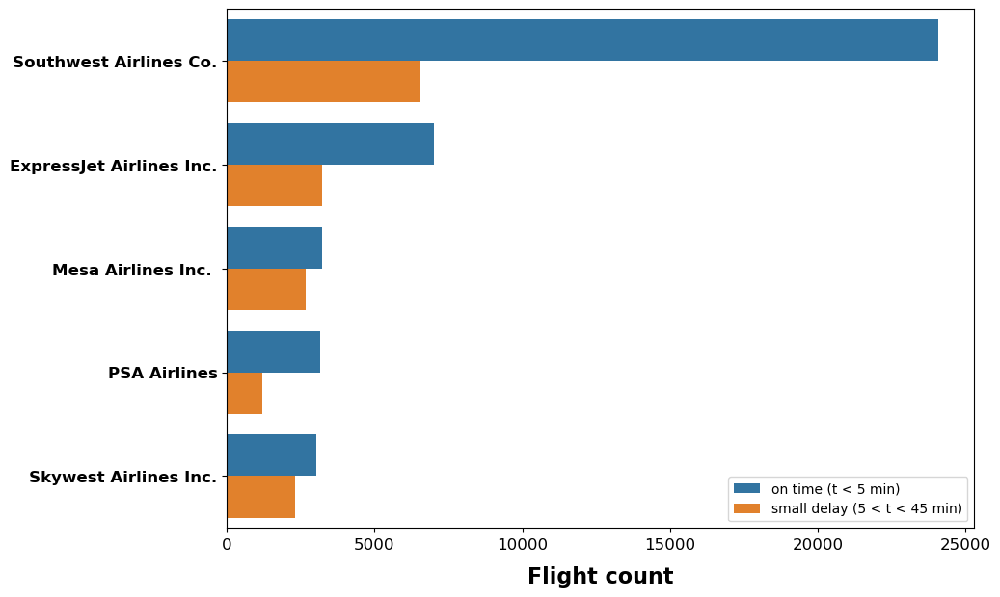

In [39]:
#_____________________________________________
# Function that define how delays are grouped
delay_type = lambda x:((0,1)[x > 5],2)[x > 45]
df['DELAY_LEVEL'] = df['DEPARTURE_DELAY'].apply(delay_type)
#print(df.groupby('DELAY_LEVEL').head())
#____________________________________________________
fig = plt.figure(1, figsize=(10,7))
ax = sns.countplot(y="AIRLINE", hue='DELAY_LEVEL', data=df)
#____________________________________________________________________________________
# We replace the abbreviations by the full names of the companies and set the labels
labels = [abbr_companies[item.get_text()] for item in ax.get_yticklabels()]
ax.set_yticklabels(labels)
plt.setp(ax.get_xticklabels(), fontsize=12, weight = 'normal', rotation = 0)
plt.setp(ax.get_yticklabels(), fontsize=12, weight = 'bold', rotation = 0)
ax.yaxis.label.set_visible(False)
plt.xlabel('Flight count', fontsize=16, weight = 'bold', labelpad=10)
#________________
# Set the legend
L = plt.legend()
L.get_texts()[0].set_text('on time (t < 5 min)')
L.get_texts()[1].set_text('small delay (5 < t < 45 min)')
#L.get_texts()[2].set_text('large delay (t > 30 min)')
plt.show()

This figure provides a count of delays of less than 5 min, of those in the interval 5 < t < 45 min. However, the proportion of delays in these two groups depends on the airline.

* Distribution of delays: establish the ranking of the airlines.

Average delays behave homogeneously among airlines and are around 36 ± 10 min, as a consequence of the large proportion of flights taking off on time. Occasionally, however, longer delays may occur. The distribution of delays by airline is examined below:

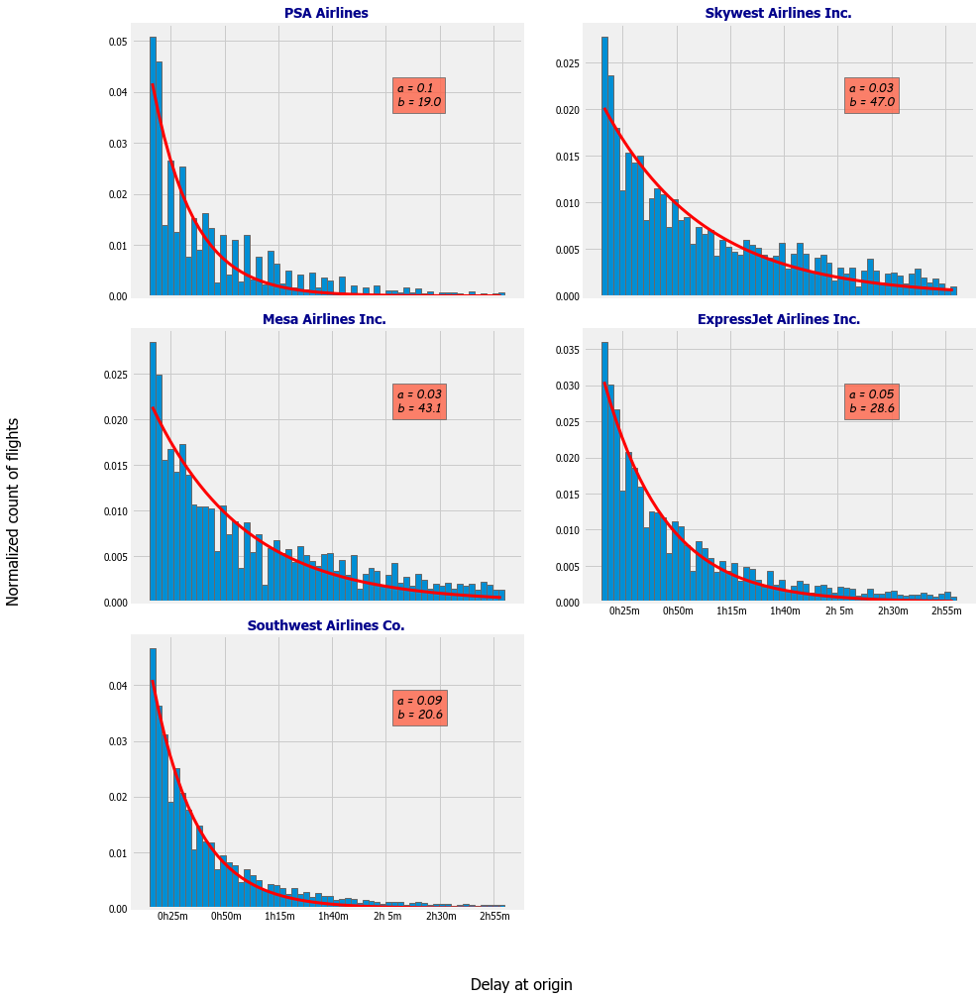

In [203]:

#___________________________________________
# Model function used to fit the histograms
def func(x, a, b):
    return a * np.exp(-x/b)
#-------------------------------------------

# The parameter meanings (and suggested defaults) are:
#left  = 0.125  # the left side of the subplots of the figure
#right = 0.9    # the right side of the subplots of the figure
#bottom = 0.1   # the bottom of the subplots of the figure
#top = 0.9      # the top of the subplots of the figure
#wspace = 0.2   # the amount of width reserved for blank space between subplots
#hspace = 0.2   # the amount of height reserved for white space between subplots

points = [] ; label_company = []
fig = plt.figure(1, figsize=(14,14))
fig.subplots_adjust(left=0.125, bottom=None, right=1.0, top=None, wspace=0.05, hspace=0.05)
i = 0
for carrier_name in [abbr_companies[x] for x in global_stats.index]:
    i += 1

    nfig = len(global_stats)

    if nfig <= 2:
        ncol = nfig
    else:
        ncol = 2

    nrow = math.ceil(nfig / ncol)

    #print('num: ', nfig)
    #print("col: {0} row: {1} fig: {2} is Even".format(ncol, int(nrow), i))

    ax = fig.add_subplot(nrow, ncol, i)

    #_________________________
    # Fit of the distribution
    n, bins, patches = plt.hist(x = df2[df2['AIRLINE']==carrier_name]['DEPARTURE_DELAY'],
                                range = (15,180), density=True, bins= 60)
    bin_centers = bins[:-1] + 0.5 * (bins[1:] - bins[:-1])    
    popt, pcov = curve_fit(func, bin_centers, n, p0 = [1, 2])
    #___________________________
    # bookeeping of the results
    points.append(popt)
    label_company.append(carrier_name)
    #______________________
    # draw the fit curve
    plt.plot(bin_centers, func(bin_centers, *popt), 'r-', linewidth=3)    
    #_____________________________________
    # define tick labels for each subplot
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.tick_params(axis='both', which='minor', labelsize=8)

    # Ticks:
    ticks = nfig - ncol
    #print('Ticks: ', int(ticks))

    if i <= ticks:
        ax.set_xticklabels(['' for x in ax.get_xticks()])
    else:
        ax.set_xticklabels(['{:2.0f}h{:2.0f}m'.format(*[int(y) for y in divmod(x,60)]) for x in ax.get_xticks()])
    #______________
    # subplot title
    plt.title(carrier_name, fontsize = 14, fontweight = 'bold', color = 'darkblue')
    #____________

    if nfig == nrow * ncol:
        seg = math.ceil(.5 * ncol)
    else:
        seg = nfig % ncol

    # Axes labels:
    if i == ncol * nrow * .5:
        ax.text(-0.3,0.0,'Normalized count of flights', fontsize=16, rotation=90,
            color='k', horizontalalignment='center', transform = ax.transAxes)

    if i ==  ncol * (nrow - .5):
        ax.text( 1.0, -0.3 ,'Delay at origin', fontsize=16, rotation=0,
            color='k', horizontalalignment='center', transform = ax.transAxes)
    #___________________________________________
    # Legend: values of the a and b coefficients
    ax.text(0.68, 0.7, 'a = {}\nb = {}'.format(round(popt[0],2), round(popt[1],1)),
            style='italic', transform=ax.transAxes, fontsize = 12, family='fantasy',
            bbox={'facecolor':'tomato', 'alpha':0.8, 'pad':5})
    
plt.tight_layout()

# Delays: take-off or landing

In the previous section, departure delays were analyzed. We now analyze the delays recorded on arrival:

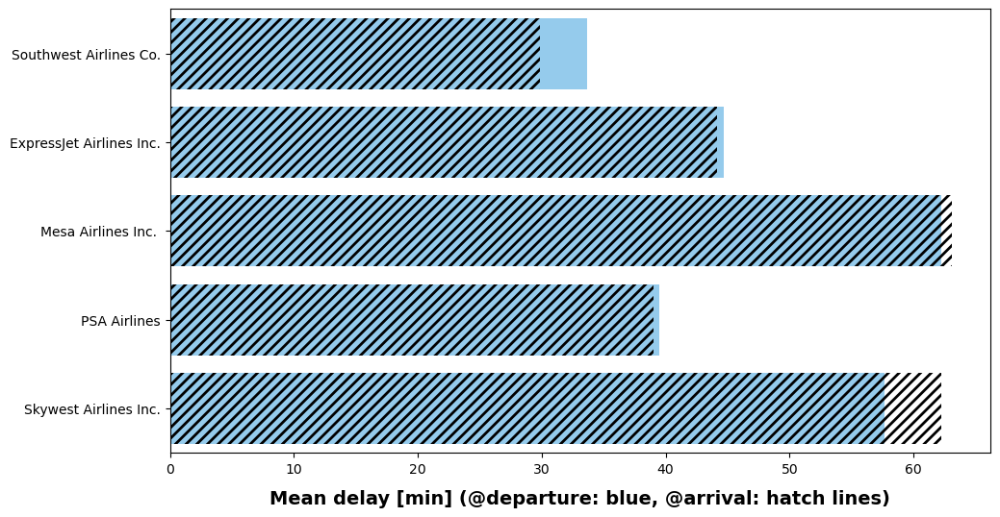

In [25]:
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['hatch.linewidth'] = 2.0  

fig = plt.figure(1, figsize=(11,6))
ax = sns.barplot(x="DEPARTURE_DELAY", y="AIRLINE", data=df, color="lightskyblue", ci=None)
ax = sns.barplot(x="ARRIVAL_DELAY", y="AIRLINE", data=df, color="r", hatch = '///',
                 alpha = 0.0, ci=None)
labels = [abbr_companies[item.get_text()] for item in ax.get_yticklabels()]
ax.set_yticklabels(labels)
ax.yaxis.label.set_visible(False)
plt.xlabel('Mean delay [min] (@departure: blue, @arrival: hatch lines)',
           fontsize=14, weight = 'bold', labelpad=10);


An additional file of this dataset, the US_Airports.csv file, gives a more exhaustive description of the airports:

In [26]:
airports = pd.read_csv("US_Airports.csv")

In order to have a global view of the geographical area covered by the dataset, the position of the airports is located and the number of flights registered during 2008 from each of them is indicated:

In [27]:
df1 = df['ORIGIN_AIRPORT'].groupby(df['ORIGIN_AIRPORT'], as_index = True, sort = True).head(1)
df1 = df1.to_frame()
df1 = df1.reset_index()
#df1 = df1.reset_index(drop=True)
df1 = df1.rename({'ORIGIN_AIRPORT':'CODE'},axis=1)
df1.head()

,index,CODE
0,0,IAD
1,2,IND
2,19,ISP
3,48,JAN
4,56,JAX


In [31]:
# Create a list with the IATA_Code
IATA_Code = df1['CODE'].tolist()
#IATA_Code

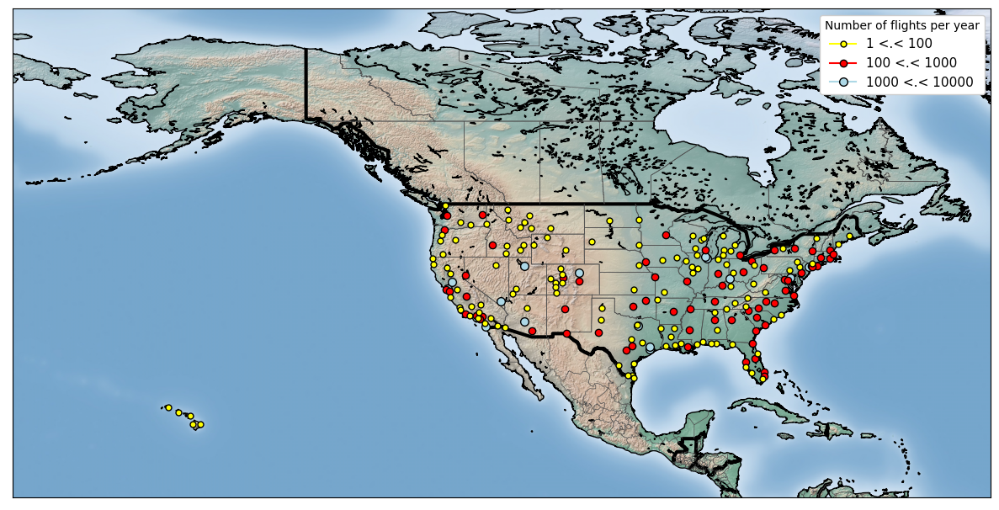

In [44]:
count_flights = df['ORIGIN_AIRPORT'].value_counts()
#print(count_flights.head())
#___________________________
plt.figure(figsize=(15,15))
#________________________________________
# define properties of markers and labels
colors = ['yellow', 'red', 'lightblue', 'purple', 'green', 'orange']
size_limits = [1, 100, 1000, 10000, 100000, 1000000]
labels = []
for i in range(len(size_limits)-1):
    labels.append("{} <.< {}".format(size_limits[i], size_limits[i+1])) 
#____________________________________________________________
map = Basemap(resolution='i',llcrnrlon=-180, urcrnrlon=-50,
              llcrnrlat=10, urcrnrlat=75, lat_0=0, lon_0=0,)
map.shadedrelief()
map.drawcoastlines()
map.drawcountries(linewidth = 3)
map.drawstates(color='0.3')
#_____________________
# put airports on map
for code in IATA_Code:
    row_col_obj = airports[airports.isin([code])].stack()
    row, col = row_col_obj._index[0]
    y = airports.at[row, 'LATITUDE']
    x = airports.at[row, 'LONGITUDE']
    x, y = map(x, y)
    isize = [i for i, val in enumerate(size_limits) if val <= count_flights[code]]  
    ind = isize[-1]
    map.plot(x, y, marker='o', markersize = ind+5, markeredgewidth = 1, color = colors[ind],
             markeredgecolor='k', label = labels[ind])
#_____________________________________________
# remove duplicate labels and set their order
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
key_order = ['1 <.< 100', '100 <.< 1000', '1000 <.< 10000', '10000 <.< 100000', '100000 <.< 1000000']
new_label = OrderedDict()
for i in range(len(by_label)):
    key = key_order[i]
    new_label[key] = by_label[key]
plt.legend(new_label.values(), new_label.keys(), loc = 1, prop= {'size':11},
           title='Number of flights per year', frameon = True, framealpha = 1)
plt.show()